In [17]:
from skimage.measure import label, regionprops, find_contours
from shapely.geometry import Polygon, LineString
from matplotlib import pyplot as plt
import geopandas as gpd
from tqdm import tqdm
import numpy as np
import cv2

import os

In [18]:
SAVE_PATH = os.path.join(os.getcwd(), 'data', 'sii', '6102')

TEST_IMAGE = '-7865300.0921486635,-4054672.2837831066,-7864077.0996961035,-4053449.2913305466.png'

GRAY_THRESHOLD = 210

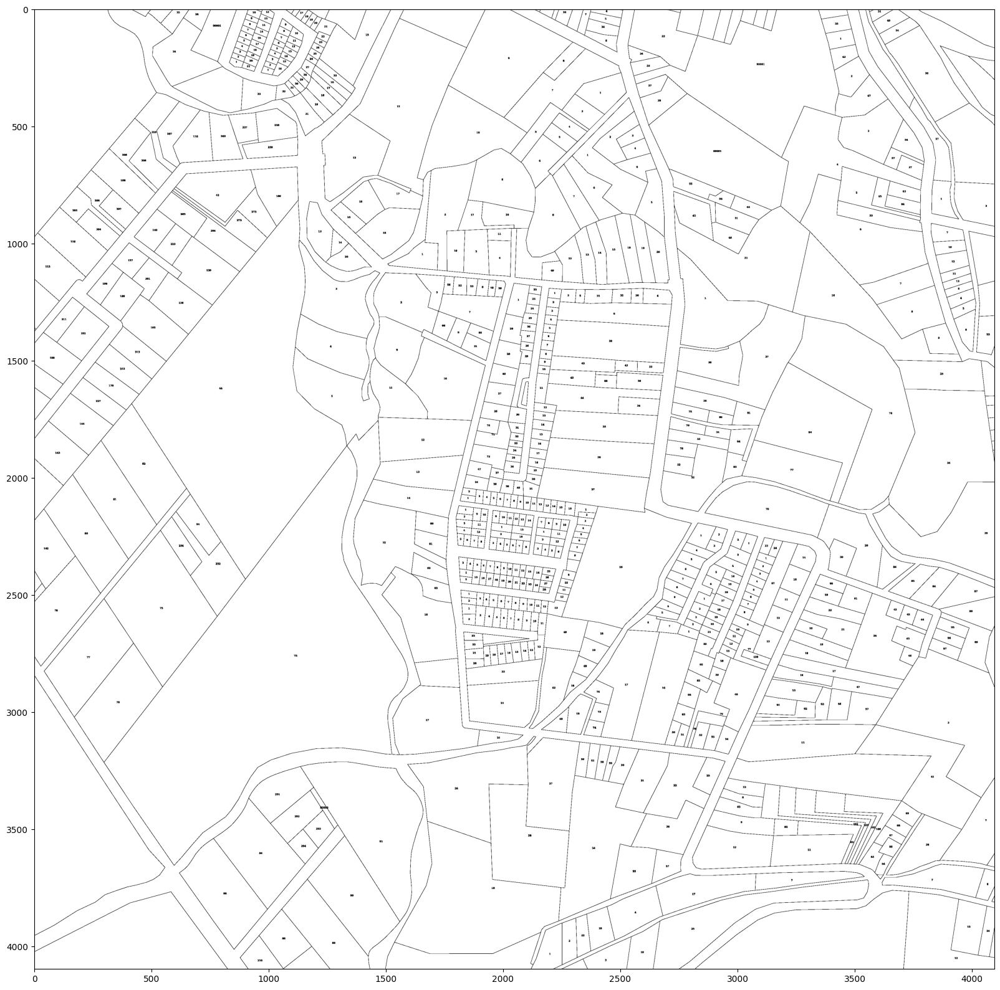

In [19]:
test_image_path = os.path.join(SAVE_PATH, str(int(float(TEST_IMAGE.split(',')[0]))), TEST_IMAGE)
img = cv2.imread(test_image_path, cv2.IMREAD_GRAYSCALE)
_, img_f = cv2.threshold(img, GRAY_THRESHOLD-1, 255, cv2.THRESH_BINARY)

fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(img_f, cmap='gray')
plt.show()

# Process Image

In [20]:
def detect_ring(image, ring_size=11, border=1, rings=1, threshold=210):
    boolean = np.where(image < threshold, 1, 0).astype(np.uint8)
    mask = np.zeros_like(image, dtype=np.uint8)
    height, width = image.shape
    outer_width = rings*(ring_size-border)+border
    for i in range(0, height-ring_size+1):
        for j in range(0, width-outer_width+1):
            outer_region = boolean[i:i+ring_size, j:j+outer_width].copy()
            inner_region = outer_region[border:-border, border:-border].copy()
            outer_region[border:-border, border:-border] = 0
            if not np.any(outer_region) and np.any(inner_region):
                mask[i:i+ring_size, j:j+outer_width] = 1
    return mask

def process_image(image, ring_size=11, border=1, rings=1, threshold=210):
    mask = detect_ring(image, ring_size, border, rings, threshold)
    mask = cv2.dilate(mask, np.ones((3, 3), np.uint8), iterations=1)
    mask = cv2.erode(mask, np.ones((3, 3), np.uint8), iterations=1)
    mask = cv2.dilate(mask, np.ones((3, 3), np.uint8), iterations=1)
    mask = cv2.erode(mask, np.ones((3, 3), np.uint8), iterations=1)
    return mask

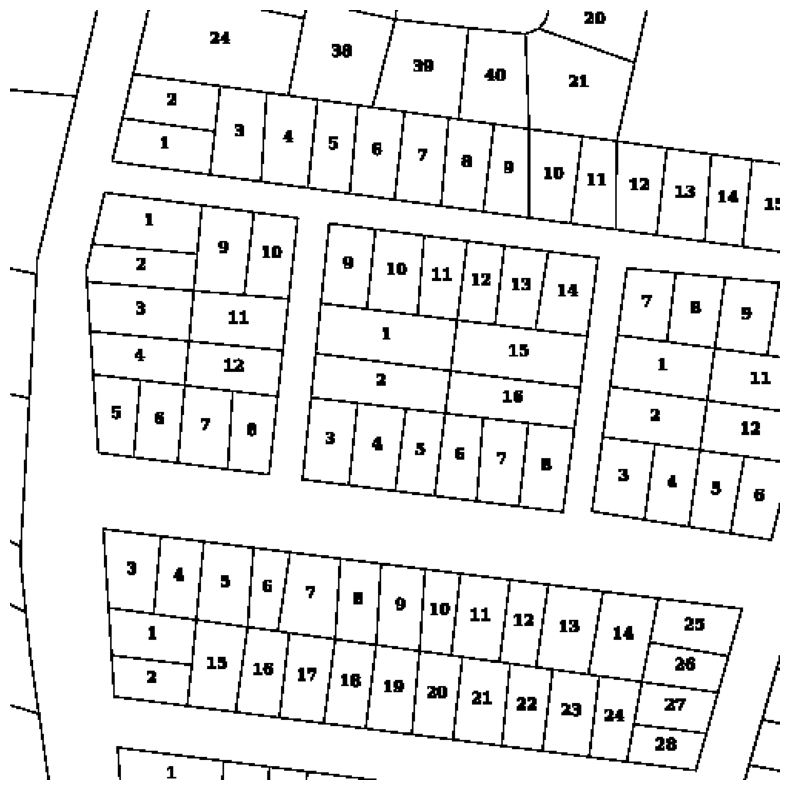

In [21]:
subimg = img_f[2000:2500, 1750:2250]
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(subimg, cmap='gray')
ax.axis('off')
plt.show()

### Detect Rings (Too Slow)

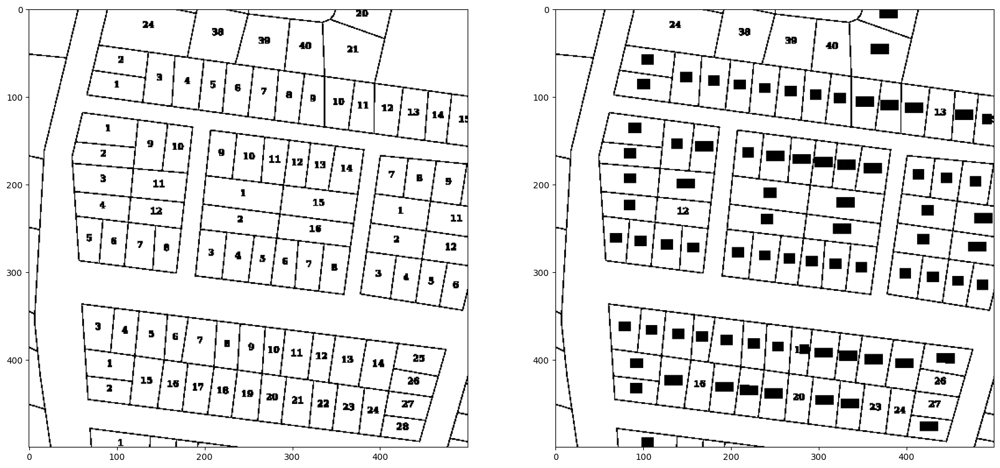

In [97]:
mask1 = detect_ring(subimg, ring_size=11, border=1, rings=1, threshold=210)
# mask2 = detect_ring(subimg, ring_size=11, border=1, rings=2, threshold=210)
# mask3 = detect_ring(subimg, ring_size=11, border=1, rings=3, threshold=210)

# mask = mask1 | mask2 | mask3 # Time: 2.8s
subimg_ring1 = boolean-mask1

fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(subimg, cmap='gray')
ax[1].imshow(subimg_ring1, cmap='gray')
plt.show()

# Countors

100%|██████████| 1532/1532 [04:06<00:00,  6.21it/s]


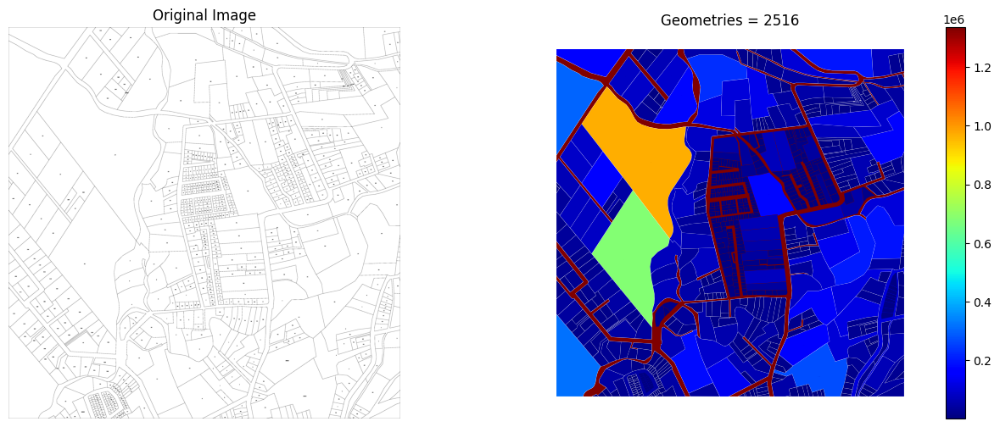

In [ ]:
test_img = img_f

boolean = np.where(test_img > 0, 1, 0).astype(np.uint8)
# mask = detect_ring(test_img, ring_size=11, border=1, rings=1, threshold=210)
# boolean = np.maximum(boolean, mask)
boolean[0, :] = 0
boolean[-1, :] = 0
boolean[:, 0] = 0
boolean[:, -1] = 0

label_img, features = label(boolean, return_num=True, connectivity=1)

def smooth_polygon(poly, tolerance=2):
    if poly.is_empty or not poly.is_valid:
        return poly
    exterior = LineString(poly.exterior.coords).simplify(tolerance, preserve_topology=True)
    return Polygon(exterior)

def remove_inner(geometries, labels):
    polygons = list()
    polygons_labels = list()
    for poly, poly_label in zip(geometries, labels):
        if not any(other.contains(poly) and other != poly for other in geometries):
            polygons.append(poly)
            polygons_labels.append(poly_label)
    return polygons, polygons_labels

regions = regionprops(label_img)
geometries, labels, areas = list(), list(), list()
for region in tqdm(regions):
    countours = find_contours(label_img == region.label, 0.5)
    for contour in countours:
        poly = Polygon(contour[:, ::-1])
        if poly.is_valid:
            poly = smooth_polygon(poly)
            geometries.append(poly)
            labels.append(region.label)
            areas.append(region.area)
# geometries, labels = remove_inner(geometries, labels)

gdf = gpd.GeoDataFrame({'label': labels, 'area_c': areas}, geometry=geometries, crs='EPSG:3857')
gdf.sort_values('area_c', ascending=False, inplace=True)
# gdf = gdf.query('area_c < 100')
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].imshow(boolean[::-1], cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
gdf.plot(ax=ax[1], column='area_c', cmap='jet', legend=True)
ax[1].set_title(f'Geometries = {len(gdf)}')
ax[1].axis('off')
plt.show()

In [123]:
gdf.query('area_c > 50').explore()

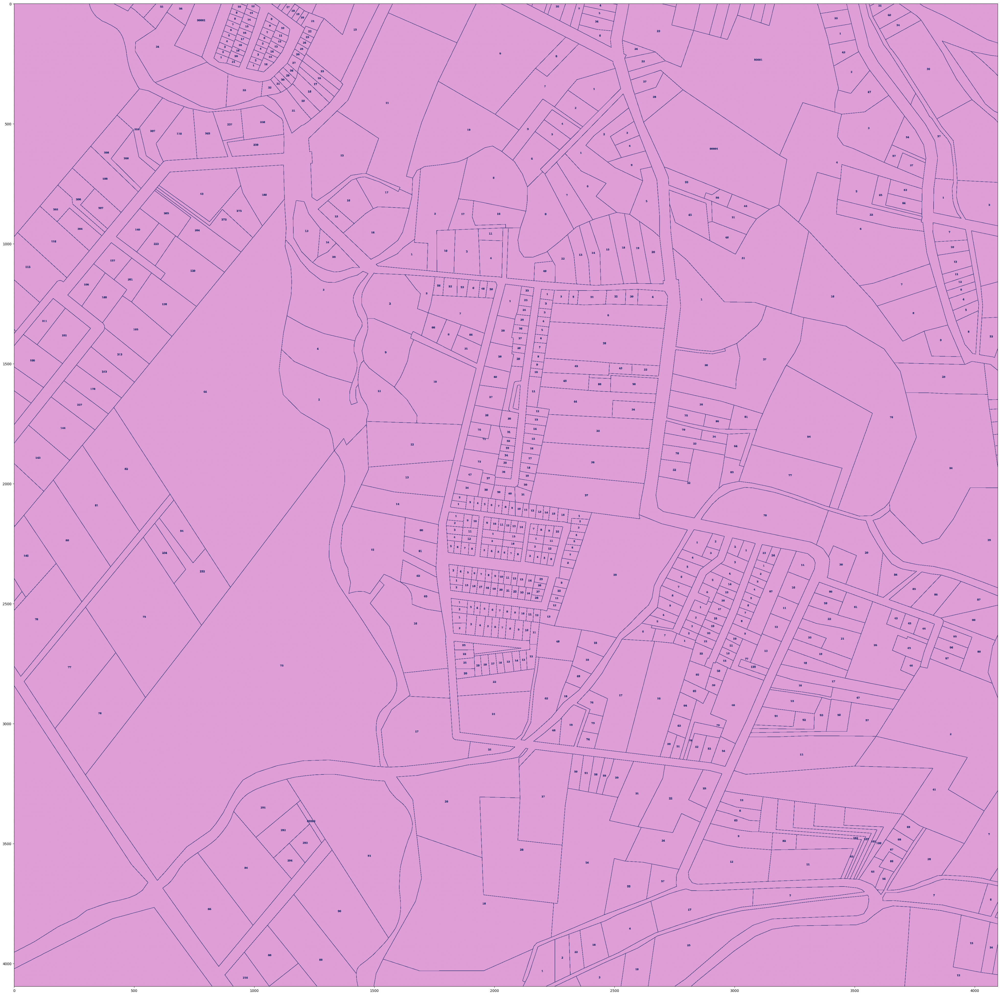

In [115]:
fig, ax = plt.subplots(1, 1, figsize=(50, 50))
ax.imshow(img_f, cmap='tab20b')
plt.show()

In [121]:
gdf.query('area_c > 10')

,label,area_c,geometry
1,2,1337017.0,"POLYGON ((2819 4094.5, 2754.5 4094, 2800 4062...."
2,2,1337017.0,"POLYGON ((1345.5 1118, 1361 1116.5, 1407 1100...."
11,2,1337017.0,"POLYGON ((2331.5 3095, 2382.5 2944, 2329 2921...."
7,2,1337017.0,"POLYGON ((2109.5 2326, 2132.5 2160, 1957 2137...."
4,2,1337017.0,"POLYGON ((2100.5 1693, 2108.5 1599, 2108 1588...."
...,...,...,...
2292,1373,13.0,"POLYGON ((2735 3313.5, 2731.5 3313, 2736 3309...."
827,490,12.0,"POLYGON ((2506 1222.5, 2504.5 1220, 2508 1217...."
2378,1434,12.0,"POLYGON ((1218 3500.5, 1215.5 3498, 1218 3494...."
2196,1318,11.0,"POLYGON ((3291 2986.5, 3289.5 2984, 3293 2982...."
